In [20]:
import sys
import seaborn as sns
import pandas as pd
import numpy as np
import multianndata as mad
import cna
import scanpy as sc
from matplotlib import pyplot as plt

from plotnine import *

In [2]:
# parameters
resolution = "major_cell_types"
analysis_name = "no_expr_pc_covars"
celltype = "Dendritic"

In [3]:
# read in the multi anndata with GeNA phenotype information
madata = cna.read(
    f"/directflow/SCCGGroupShare/projects/blabow/tenk10k_phase1/data_processing/csa_qtl/output/multianndata/{resolution}/{analysis_name}/{celltype}_scDataObject.dimreduc.pca.gena_pheno.h5ad"
)


Only considering the two last: ['.gena_pheno', '.h5ad'].
Only considering the two last: ['.gena_pheno', '.h5ad'].


In [4]:
madata.obs

,id,sequencing_library,cohort,wg2_scpred_prediction,npheno_1:143272081:G:C,npheno_2:16395367:G:GACACACACACACCACACACACCTCACACACCACAGAGACACACACACCTCACACACCATAGAGACACACACACCTCACACACCATAGAGACACACACACCTCACACACCATAGAGAC,npheno_10:42301537:A:G,npheno_19:27243890:C:T,npheno_12:121634284:G:T,npheno_11:28430510:G:GC,...,npheno_7:55402316:TC:T,npheno_11:41304915:TG:T,npheno_5:148210292:GTATGTTTCTGCATACATATATATGTATGTGTTTCTGCATACATATA:G,npheno_6:168653613:TCCTGAGCTCCAACCAAATGTTAGGAACTCACCAACCCTCTA:T,npheno_12:3768428:A:G,npheno_7:119907178:ATG:A,npheno_5:17389869:A:G,npheno_8:133757941:T:TG,npheno_12:110172923:G:A,npheno_14:104890358:A:ATGGAT
AAAGGATTCACCCTGT_S0056a,CPG248245,S0056a,BioHEART,cDC1,0.014453,-0.020435,-0.003758,0.047284,-0.013295,-0.031983,...,-0.003684,-0.046223,-0.003879,-0.007066,0.020401,-0.008620,0.005171,0.015039,0.037317,0.002087
AACCTTTAGGTTGACG_S0056a,CPG248534,S0056a,BioHEART,cDC2,-0.004168,0.020619,0.006312,-0.002234,-0.023214,0.041075,...,0.015543,0.026551,-0.021014,-0.032000,0.018631,0.011749,-0.006381,-0.023303,0.024473,0.031543
AACTTCTAGTTGAAGT_S0056a,CPG247833,S0056a,BioHEART,cDC2,0.034958,-0.027988,-0.026450,0.020463,0.013650,-0.008556,...,0.000533,-0.002683,-0.048048,-0.008822,-0.040834,-0.033644,0.014410,-0.023827,0.029707,0.019811
AAGCCATCAGGAGACT_S0056a,CPG247858,S0056a,BioHEART,cDC2,0.192515,-0.142307,-0.120210,0.132229,0.077832,-0.097903,...,-0.074319,-0.065692,-0.067936,0.083930,-0.053338,0.016530,0.040839,-0.083683,0.028503,-0.058968
AAGCCATCATCAGTCA_S0056a,CPG247833,S0056a,BioHEART,cDC2,0.136434,-0.106803,-0.087115,0.123979,0.105051,-0.079642,...,-0.058898,-0.066507,-0.079250,0.086739,-0.055301,-0.003901,0.052991,-0.047051,0.016619,-0.047325
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGGGCGTCAGAGTGG_S0176,CPG500348,S0176,BioHEART,ASDC,0.005529,0.022369,0.035598,-0.005958,-0.009179,0.013240,...,0.003356,0.055989,0.028713,0.006494,-0.016497,0.088110,0.008761,0.024015,-0.005003,0.030469
TTGTTGTGTACGATGG_S0176,CPG500082,S0176,BioHEART,ASDC,0.014960,0.023228,0.015168,-0.009635,0.024589,0.017162,...,0.005536,0.055765,0.043459,0.026959,0.017802,0.079435,0.009546,0.002210,0.007488,0.022384
TTGTTTGAGGCGAAGG_S0176,CPG500025,S0176,BioHEART,cDC2,-0.197165,0.185550,0.142052,-0.134268,-0.161954,0.155241,...,0.109087,0.076952,0.091424,-0.152468,0.088787,0.012265,-0.105607,0.058917,-0.080929,0.121055
TTTATGCCAACGTTAC_S0176,CPG500249,S0176,BioHEART,cDC2,-0.083308,0.070525,0.074760,-0.071301,-0.085594,0.066940,...,0.050062,0.070398,0.067198,-0.049242,0.026111,0.003323,-0.061550,0.055243,-0.026149,0.024190


/directflow/SCCGGroupShare/projects/blabow/.conda/envs/gena-env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/directflow/SCCGGroupShare/projects/blabow/.conda/envs/gena-env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


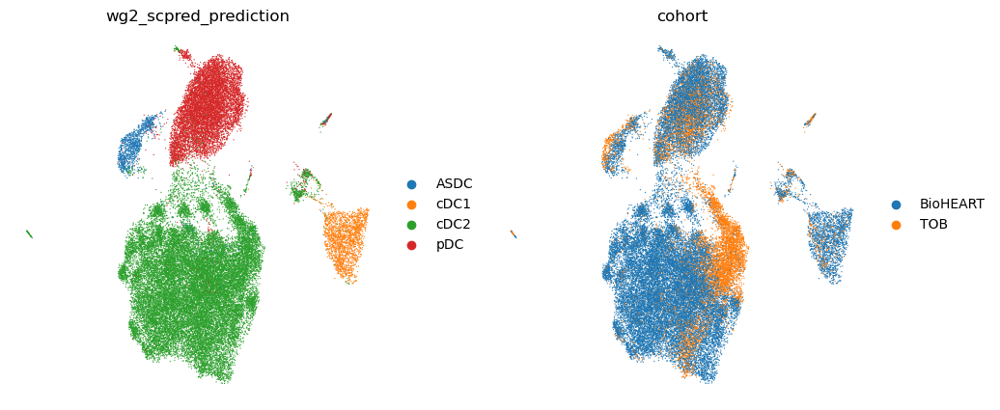

In [16]:
# umap plots
with rc_context({"figure.figsize": (5, 5)}):
    sc.pl.umap(
        madata,
        color=["wg2_scpred_prediction", "cohort"],
        frameon=False,
        ncols=4,
    )

/directflow/SCCGGroupShare/projects/blabow/.conda/envs/gena-env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/directflow/SCCGGroupShare/projects/blabow/.conda/envs/gena-env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


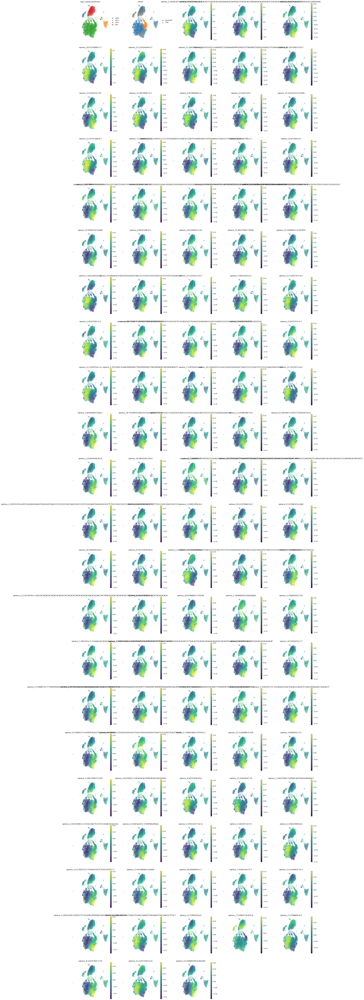

In [17]:
# plot neighbourhood abundance correllations
with plt.rc_context({"figure.figsize": (5, 5)}):
    sc.pl.umap(
        madata,
        color=["wg2_scpred_prediction", "cohort"] + madata.obs.columns[4:].tolist(),
        frameon=False,
        ncols=5,
    )

/directflow/SCCGGroupShare/projects/blabow/.conda/envs/gena-env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
/directflow/SCCGGroupShare/projects/blabow/.conda/envs/gena-env/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


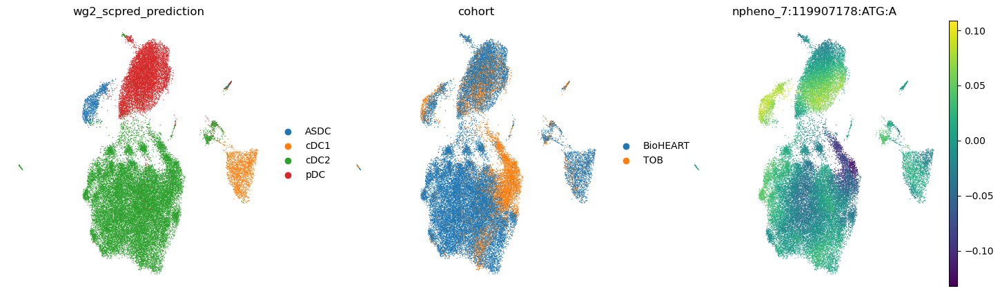

In [22]:
with plt.rc_context({"figure.figsize": (5, 5)}):
    sc.pl.umap(
        madata,
        color=["wg2_scpred_prediction", "cohort", "npheno_7:119907178:ATG:A"],
        frameon=False,
        ncols=4,
    )

Here we can see replication of the csaQTL discovered in the onek1k cohort. This is most obvious for 2:111050100:G:A, where the alternate allele is associated with depletion of the NK CD65 bright cells. 